In [1]:
import threading
threading.active_count()

7

In [2]:
# Import Gaussian self-consistent integrator instead of original
from gaussian_retarded_integrator import gaussian_retarded_integrator3
from covariant_integrator_library import *  # For boundary conditions and other utilities
from bunch_inits import *
from plotting_variables import *

font_size = 16
# Update the rcParams dictionary to set the font size globally
plt.rcParams.update({'font.size': font_size})

print("🔧 Gaussian Self-Consistent Two-Particle Demo")
print("   Using improved integrator that solves bootstrapping problem")

🔧 Gaussian Self-Consistent Two-Particle Demo
   Using improved integrator that solves bootstrapping problem


In [3]:
# Reload the updated modules
import importlib
import gaussian_retarded_integrator
import gaussian_self_consistent_integrator
importlib.reload(gaussian_retarded_integrator)
importlib.reload(gaussian_self_consistent_integrator)
from gaussian_retarded_integrator import gaussian_retarded_integrator3

print("🔄 Modules reloaded with velocity constraint fixes")

🔄 Modules reloaded with velocity constraint fixes


# Gaussian Self-Consistent Two-Particle Demo

This notebook demonstrates the Gaussian self-consistent integrator using the same critical benchmarking parameters as the original two_particle_demo_main.ipynb.

### Critical variables for this test:
#### note that the macroparticle count is not implemented yet as a variable.

In [4]:
c_ms = 299792458

transv_dist = 1e-4

m_particle_rider = 1.007319468  #proton -amu
m_particle_driver = 207.2 #lead, amu
#m_particle = 0.0005485   #electron -amu
#m_particle = 315 #gold hexafloride, amu

stripped_ions_rider = 1.
stripped_ions_driver = 54.
charge_sign_rider= -1.
charge_sign_driver = 1.

starting_Pz_rider = 1.01e6   #3.25E5 corresponds to 1 TeV
starting_Pz_driver = -starting_Pz_rider/m_particle_driver*m_particle_rider  #actually velocity-like, mass factored later
transv_mom_rider = 0. #1e-6   #1e-2 is roughly 10keV scale
transv_mom_driver = transv_mom_rider#*207 # lazy adding lead mass
starting_distance_rider = 1e-6
starting_distance_driver = 100.

sim_type = 2    # type 2 used here, it is for bunch--bunch simulations
pcount_rider = 10    #bunch counts
pcount_driver = 10



#### Beam inits

In [7]:
# Enable debug mode
debug_mode = True
print(f"E_MeV = ", retarded_traj_pre[0]['gamma']*E_MeV_rest_rider)
print(f"Gamma = ", retarded_traj_pre[0]['gamma'])
print(f"E_rest = ", E_MeV_rest_rider)

NameError: name 'retarded_traj_pre' is not defined

In [8]:
init_driver, E_MeV_rest_driver = init_bunch(starting_distance_driver,transv_mom_driver,starting_Pz_driver,stripped_ions_driver,m_particle_driver,-transv_dist,pcount_driver,charge_sign_driver)


E_MeV =  -3161366.99910943
Gamma =  16.408877873253513
E_rest =  193020.75925874696


#### Function call 

In [9]:
#### parameters not used in this test, but required to run integrator
bunch_dist = 1E5   #bunch--bunch distance at which the driver bunch has maximum charge (gaussian mean)
cav_spacing = 1E5  #distance to the subsequent driver bunch
aperture = 1E5 #this parameter reused for bunch-driven gaussian sigma
z_cutoff = 0
wall_pos= 1E5


#coarse initialization
static_steps = 1#set init_steps equal to tot_steps to test static integrator only
ret_steps = 25
step_size = 2e-6

#interaction zone
static_steps2 = 1
ret_steps2 = 5000
step_size2 = 7e-7


In [24]:
print("🚀 Running Gaussian Self-Consistent Integrator...")
print(f"   Phase 1: {static_steps} static + {ret_steps} retarded steps, h={step_size:.1e}")
print(f"   Phase 2: {static_steps2} static + {ret_steps2} retarded steps, h={step_size2:.1e}")

# Use Gaussian self-consistent integrator instead of original (with debug mode)
retarded_traj_pre, retarded_drv_traj_pre = gaussian_retarded_integrator3(
    init_rider, init_driver, static_steps + ret_steps, step_size, wall_pos, aperture, debug_mode)

print("Phase 1 completed, starting Phase 2...")
retarded_traj, retarded_drv_traj = gaussian_retarded_integrator3(
    retarded_traj_pre[-1], retarded_drv_traj_pre[-1], static_steps2 + ret_steps2, step_size2, wall_pos, aperture, debug_mode)

print("✅ Gaussian integration completed successfully!")

🚀 Running Gaussian Self-Consistent Integrator...
   Phase 1: 1 static + 25 retarded steps, h=2.0e-06
   Phase 2: 1 static + 5000 retarded steps, h=7.0e-07
Gaussian Self-Consistent Integrator initialized
Unit system: c = 299.792458 mm/ns (Gaussian CGS)
🔧 Gaussian retarded integrator starting:
   Static steps: 1, Retarded steps: 25
   Step size: 2.0e-06 ns, Total steps: 26
🔄 Self-consistent step: h=2.00e-06, particles=10
   Particle 0: Converged after 2 iterations (Δγ=0.00e+00)
   Particle 1: Converged after 2 iterations (Δγ=0.00e+00)
   Particle 2: Converged after 2 iterations (Δγ=0.00e+00)
   Particle 3: Converged after 2 iterations (Δγ=0.00e+00)
   Particle 4: Converged after 2 iterations (Δγ=0.00e+00)
   Particle 5: Converged after 2 iterations (Δγ=0.00e+00)
   Particle 6: Converged after 2 iterations (Δγ=0.00e+00)
   Particle 7: Converged after 2 iterations (Δγ=0.00e+00)
   Particle 8: Converged after 2 iterations (Δγ=0.00e+00)
   Particle 9: Converged after 2 iterations (Δγ=0.00e+0

### Calculate plotting variables
#### note that these are only reading the first particle from each trajectory for most parameters. (longitudinal and transverse diplacement takes a mean)

In [25]:
delta_e, delta_e_drv, tot_e, tot_e_drv, delta_e_keV, delta_e_MeV, tot_e_GeV, delta_e_keV_drv, delta_e_MeV_drv, tot_e_GeV_drv, zs, xs, zs_drv, xs_drv, bzs, bxs, bys, bdotxs, bdotys, bdotzs, Pzs, Pxs, Pys, Pts, gammas, tees, bzs_drv, bxs_drv, bys_drv, bdotxs_drv, bdotys_drv, bdotzs_drv, Pzs_drv, Pxs_drv, Pys_drv, Pts_drv, gammas_drv, tees_drv, qs_drv, gam_fixed, bdotzs_seconds, q_statC_squared, q_kg_m3_sneg2, Pows_z_rider_watts = calculate_plotting_variables(retarded_traj,
retarded_drv_traj, init_rider, init_driver, static_steps, ret_steps, E_MeV_rest_rider, E_MeV_rest_driver, c_ms)

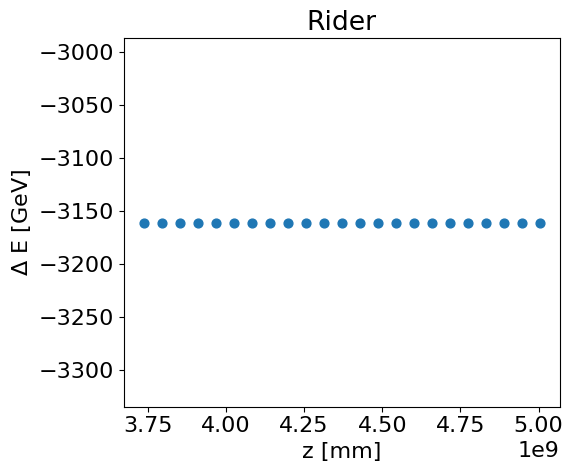

In [26]:
fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(1, 1, 1) 
ax.scatter(zs,delta_e_MeV/1000,s=40)
#ax.scatter(zs_drv,delta_e_MeV_drv,s=40)
#ax.scatter(tees,np.abs(np.multiply(qs_drv,1E-2)),s=40)
ax.set_ylabel(r"$\Delta$ E [GeV]")
ax.set_xlabel(r"z [mm]")
#ax.axvline(30,color='g',label="wall paosition")
#plt.xlim(starting_distance_rider/2,3)
#plt.ylim(1E-2,2e3)
#plt.xscale('log')  #log scale works at 1mm range
#plt.yscale('log')
plt.title("Rider")
plt.tight_layout()
#plt.savefig("./6.26_prot_antiprot_10nm.png",dpi=600)
plt.show()

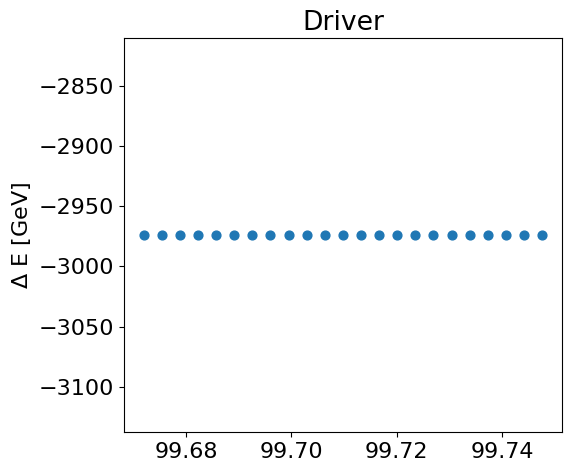

In [27]:
fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(1, 1, 1) 
#ax.scatter(zs,delta_e_MeV,s=40)
ax.scatter(zs_drv,delta_e_MeV_drv/1000,s=40)
#ax.scatter(zs_drv,np.abs(delta_e_MeV_drv/1000),s=40)  #for log plotting
#ax.scatter(tees,np.abs(np.multiply(qs_drv,1E-2)),s=40)
ax.set_ylabel(r"$\Delta$ E [GeV]")
#ax.set_xlabel(r"z [mm]")
#ax.axvline(30,color='g',label="wall paosition")
#plt.xlim(-0.54,0.01)
#plt.ylim(1E-5,5e3)
#plt.xscale('log')
#plt.yscale('log')
plt.title("Driver")
plt.tight_layout()
#plt.savefig("./6.26_prot_antiprot_10nm.png",dpi=600)
plt.show()



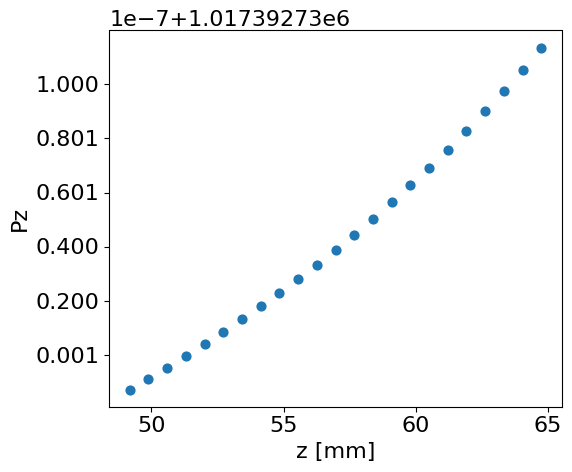

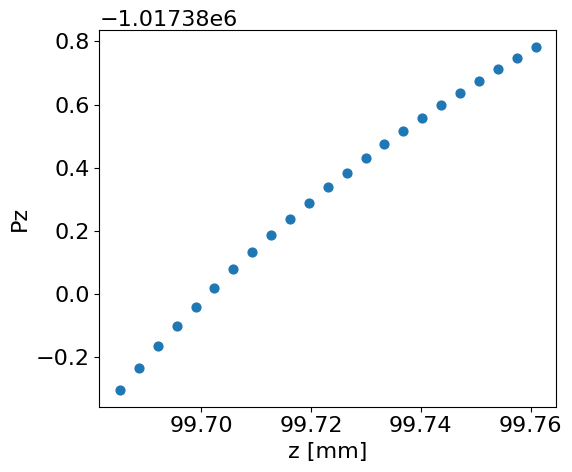

In [ ]:
fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(1, 1, 1) 
ax.scatter(zs,Pzs,s=40)
#ax.scatter(tees,np.abs(np.multiply(qs_drv,1E-2)),s=40)
ax.set_ylabel(r"Pz")
ax.set_xlabel(r"z [mm]")
#ax.axvline(30,color='g',label="wall paosition")
#plt.xlim(-315,45)
#plt.yscale('log')
plt.tight_layout()
#plt.savefig("/home/benfolsom/notebooks/cov_ret_prab_figures/6.15_35MeV_electron_pinholev1.png",dpi=600)
plt.show()


fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(1, 1, 1) 
ax.scatter(zs_drv,Pzs_drv,s=40)
#ax.scatter(tees,np.abs(np.multiply(qs_drv,1E-2)),s=40)
ax.set_ylabel(r"Pz")
ax.set_xlabel(r"z [mm]")
#ax.axvline(30,color='g',label="wall paosition")
#plt.xlim(-315,45)
#plt.yscale('log')
plt.tight_layout()
#plt.savefig("/home/benfolsom/notebooks/cov_ret_prab_figures/6.15_35MeV_electron_pinholev1.png",dpi=600)
plt.show()

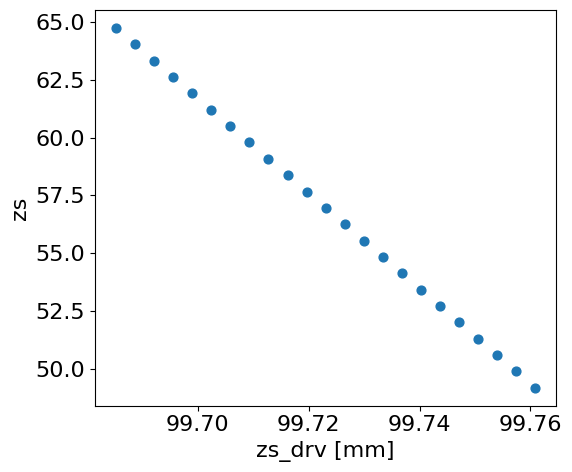

In [ ]:
fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(1, 1, 1) 
ax.scatter(zs_drv,zs,s=40)
#ax.scatter(tees,np.abs(np.multiply(qs_drv,1E-2)),s=40)
ax.set_ylabel(r"zs")
ax.set_xlabel(r"zs_drv [mm]")
#ax.axvline(30,color='g',label="wall paosition")
#plt.xlim(-315,45)
#plt.ylim(2E-2,5)
#plt.yscale('log')
plt.tight_layout()
#plt.savefig("./6.26_prot_antiprot_10nm.png",dpi=600)
plt.show()

### Various other plots

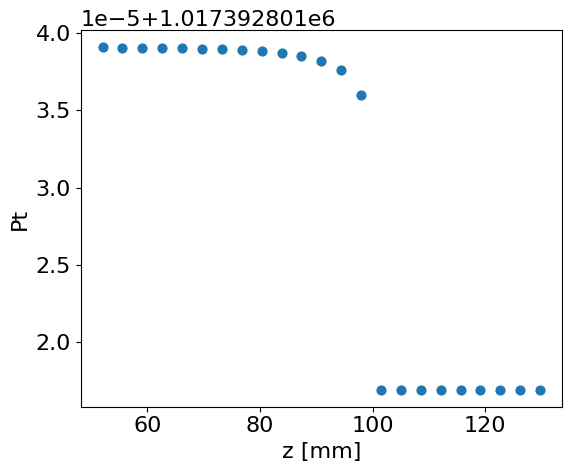

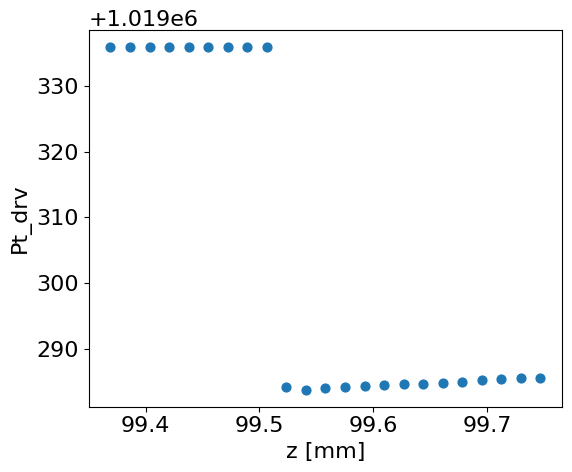

In [ ]:
fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(1, 1, 1) 
ax.scatter(zs,Pts,s=40)
#ax.scatter(tees,np.abs(np.multiply(qs_drv,1E-2)),s=40)
ax.set_ylabel(r"Pt")
ax.set_xlabel(r"z [mm]")
#ax.axvline(30,color='g',label="wall paosition")
#plt.xlim(-315,45)
#plt.yscale('log')
plt.tight_layout()
#plt.savefig("/home/benfolsom/notebooks/cov_ret_prab_figures/6.15_35MeV_electron_pinholev1.png",dpi=600)
plt.show()


fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(1, 1, 1) 
ax.scatter(zs_drv,Pts_drv,s=40)
#ax.scatter(tees,np.abs(np.multiply(qs_drv,1E-2)),s=40)
ax.set_ylabel(r"Pt_drv")
ax.set_xlabel(r"z [mm]")
#ax.axvline(30,color='g',label="wall paosition")
#plt.xlim(-315,45)
#plt.yscale('log')
plt.tight_layout()
#plt.savefig("/home/benfolsom/notebooks/cov_ret_prab_figures/6.15_35MeV_electron_pinholev1.png",dpi=600)
plt.show()

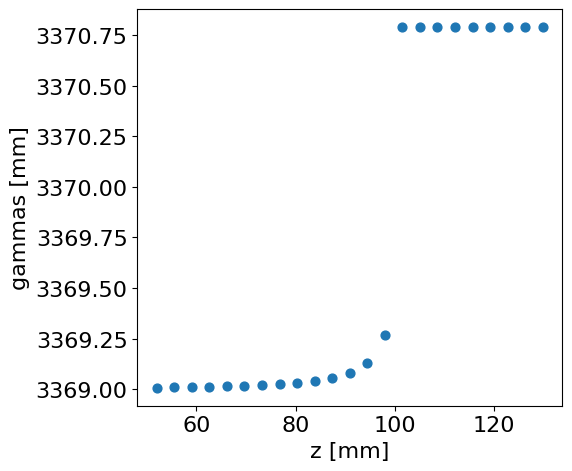

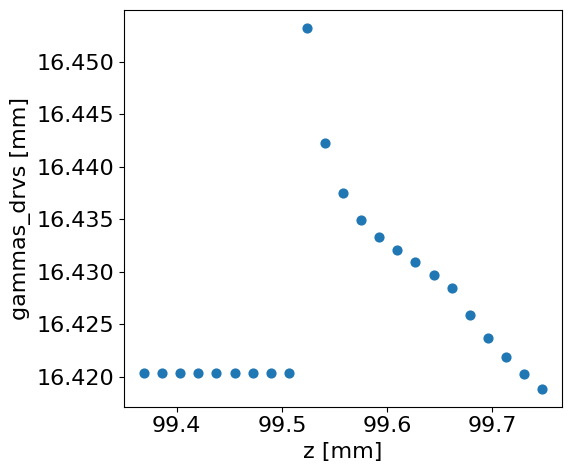

In [ ]:
fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(1, 1, 1) 
ax.scatter(zs,gammas,s=40)
#ax.scatter(tees,np.abs(np.multiply(qs_drv,1E-2)),s=40)
ax.set_ylabel(r"gammas [mm]")
ax.set_xlabel(r"z [mm]")
#ax.axvline(30,color='g',label="wall paosition")
#plt.xlim(-315,45)
#plt.yscale('log')
plt.tight_layout()
#plt.savefig("/home/benfolsom/notebooks/cov_ret_prab_figures/6.15_35MeV_electron_pinholev1.png",dpi=600)
plt.show()


fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(1, 1, 1) 
ax.scatter(zs_drv,gammas_drv,s=40)
#ax.scatter(tees,np.abs(np.multiply(qs_drv,1E-2)),s=40)
ax.set_ylabel(r"gammas_drvs [mm]")
ax.set_xlabel(r"z [mm]")
#ax.axvline(30,color='g',label="wall paosition")
#plt.xlim(-315,45)
#plt.yscale('log')
plt.tight_layout()
#plt.savefig("/home/benfolsom/notebooks/cov_ret_prab_figures/6.15_35MeV_electron_pinholev1.png",dpi=600)
plt.show()

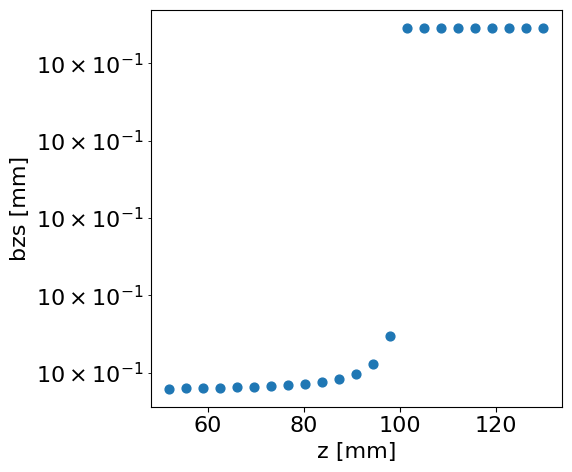

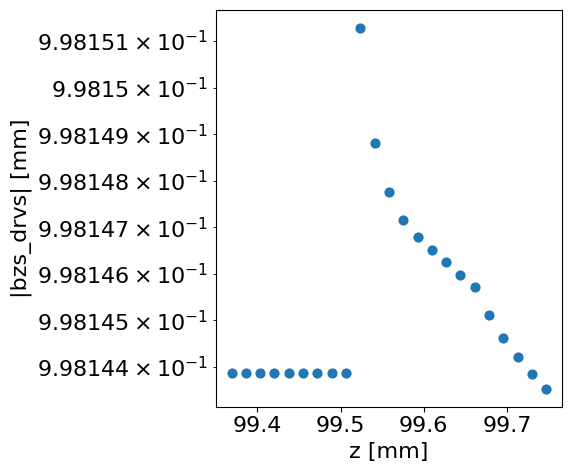

In [ ]:
fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(1, 1, 1) 
ax.scatter(zs,bzs,s=40)
#ax.scatter(tees,np.abs(np.multiply(qs_drv,1E-2)),s=40)
ax.set_ylabel(r"bzs [mm]")
ax.set_xlabel(r"z [mm]")
#ax.axvline(30,color='g',label="wall paosition")
#plt.xlim(-315,45)
plt.yscale('log')
plt.tight_layout()
#plt.savefig("/home/benfolsom/notebooks/cov_ret_prab_figures/6.15_35MeV_electron_pinholev1.png",dpi=600)
plt.show()


fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(1, 1, 1) 
ax.scatter(zs_drv,np.abs(bzs_drv),s=40)
#ax.scatter(tees,np.abs(np.multiply(qs_drv,1E-2)),s=40)
ax.set_ylabel(r"|bzs_drvs| [mm]")
ax.set_xlabel(r"z [mm]")
#ax.axvline(30,color='g',label="wall paosition")
#plt.xlim(-315,45)
plt.yscale('log')
plt.tight_layout()
#plt.savefig("/home/benfolsom/notebooks/cov_ret_prab_figures/6.15_35MeV_electron_pinholev1.png",dpi=600)
plt.show()